# Potato Model Comparisons

### Import Dependencies

In [30]:
import tensorflow as tf
from PIL import Image
import cv2, pathlib
from tensorflow.keras.layers import *
from keras.preprocessing.image import ImageDataGenerator
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from keras.preprocessing import image
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
from sklearn.metrics import confusion_matrix, classification_report
import os
import shutil
import pickle
import tempfile
from sklearn.model_selection import train_test_split

In [31]:
physical_devices = tf.config.experimental.list_physical_devices('GPU')
print("Num GPUs Available: ", len(physical_devices))

Num GPUs Available:  1


In [32]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [33]:
import zipfile
zip_ref = zipfile.ZipFile("/content/drive/MyDrive/FINAL_PROJECT/potato.zip", 'r')
zip_ref.extractall('/content/data')
zip_ref.close()

### Reload Data

In [34]:
IMAGE_SIZE = 224
TARGET_SIZE = (IMAGE_SIZE, IMAGE_SIZE)
INPUT_SHAPE = (IMAGE_SIZE, IMAGE_SIZE, 3)
CHANNELS = 3
BATCH_SIZE = 32
INPUT_SHAPE2 = (BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, CHANNELS)

In [35]:
# Set up the base directory
base_dir = "/content/data/potato"

In [36]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
            base_dir,
            labels = 'inferred',
            shuffle = True,
            image_size = (IMAGE_SIZE, IMAGE_SIZE),
            batch_size = BATCH_SIZE,
            color_mode = 'rgb'
)

Found 2144 files belonging to 3 classes.


In [37]:
type(dataset)

tensorflow.python.data.ops.batch_op._BatchDataset

In [38]:
classes = dataset.class_names
classes

['potato early blight', 'potato healthy', 'potato late blight']

In [39]:
len(dataset)

67

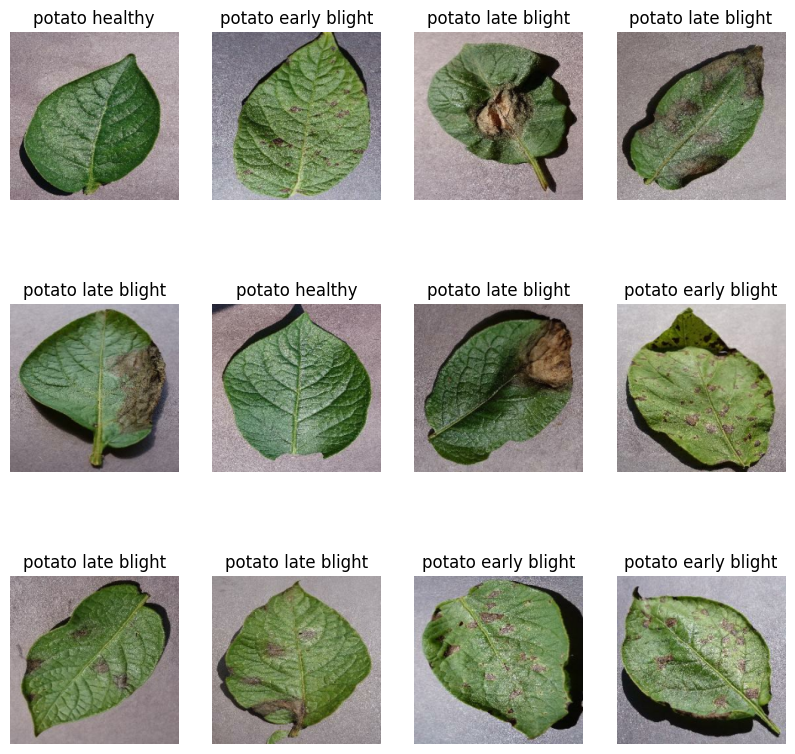

In [40]:
plt.figure(figsize=(10,10))
for image_batch , label_batch in dataset.take(1):
    for i in range(12):
        ax = plt.subplot(3,4,i+1)
        plt.imshow(image_batch[i].numpy().astype('uint8'))
        plt.title(classes[label_batch[i]])
        plt.axis('off')

In [41]:
len(dataset) * 32

2144

### Data Splitting

In [42]:
def data_split(data, train_split = 0.8, val_split = 0.15, 
               test_split = 0.05, shuffle=True, shuffle_size = 10000):
    data_size = len(data)
    if shuffle:
        data = data.shuffle(shuffle_size, seed=8)
    
    train_size = int(train_split * data_size)
    val_size = int(val_split * data_size)
    
    train_ds = data.take(train_size)
    val_ds = data.skip(train_size).take(val_size)
    test_ds = data.skip(train_size).skip(val_size)
    
    return train_ds, val_ds, test_ds

In [43]:
train_ds, val_ds, test_ds = data_split(dataset)

In [44]:
print("Length of Training Dataset is",len(train_ds))
print("\nLength of Validation Dataset is",len(val_ds))
print("\nLength of Testing Dataset is",len(test_ds))

Length of Training Dataset is 53

Length of Validation Dataset is 10

Length of Testing Dataset is 4


### Model 1: DenseNet121





In [45]:
model_path = '/content/drive/MyDrive/FINAL_PROJECT/POTATO/DenseNet/DenseNet121Model_Potato2.h5'
Model1_DenseNet = tf.keras.models.load_model(model_path)
Model1_DenseNet.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 tf.math.truediv_2 (TFOpLamb  (None, 224, 224, 3)      0         
 da)                                                             
                                                                 
 tf.nn.bias_add_1 (TFOpLambd  (None, 224, 224, 3)      0         
 a)                                                              
                                                                 
 tf.math.truediv_3 (TFOpLamb  (None, 224, 224, 3)      0         
 da)                                                             
                                                                 
 densenet121 (Functional)    (None, 7, 7, 1024)        7037504   
                                                           

In [46]:
score_train = Model1_DenseNet.evaluate(train_ds)
score_valid = Model1_DenseNet.evaluate(val_ds)
score_test = Model1_DenseNet.evaluate(test_ds)

4/4 [==============================] - 2s 99ms/step - loss: 0.0027 - accuracy: 1.0000


first image to predict
actual label: potato late blight
1/1 [==============================] - 2s 2s/step
predicted label: potato late blight


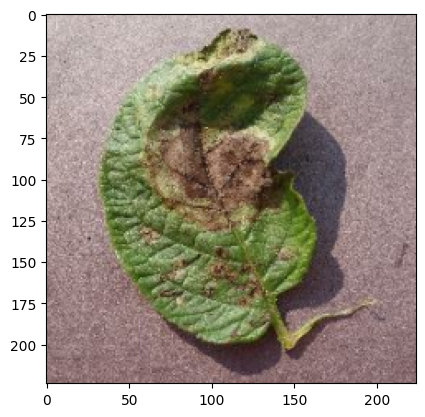

In [47]:
import numpy as np
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()
    
    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",classes[first_label])
    
    batch_prediction = Model1_DenseNet.predict(images_batch)
    print("predicted label:",classes[np.argmax(batch_prediction[0])])

In [48]:
def predict(model,img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0) # Create a batch
    predictions = model.predict (img_array)
    predicted_class = classes[np.argmax(predictions[0])]
#     confidence = round(np.max(predictions[0]),2)
    confidence = round(100*(np.max(predictions[0])),2)

    return predicted_class, confidence

1/1 [==============================] - 0s 29ms/step


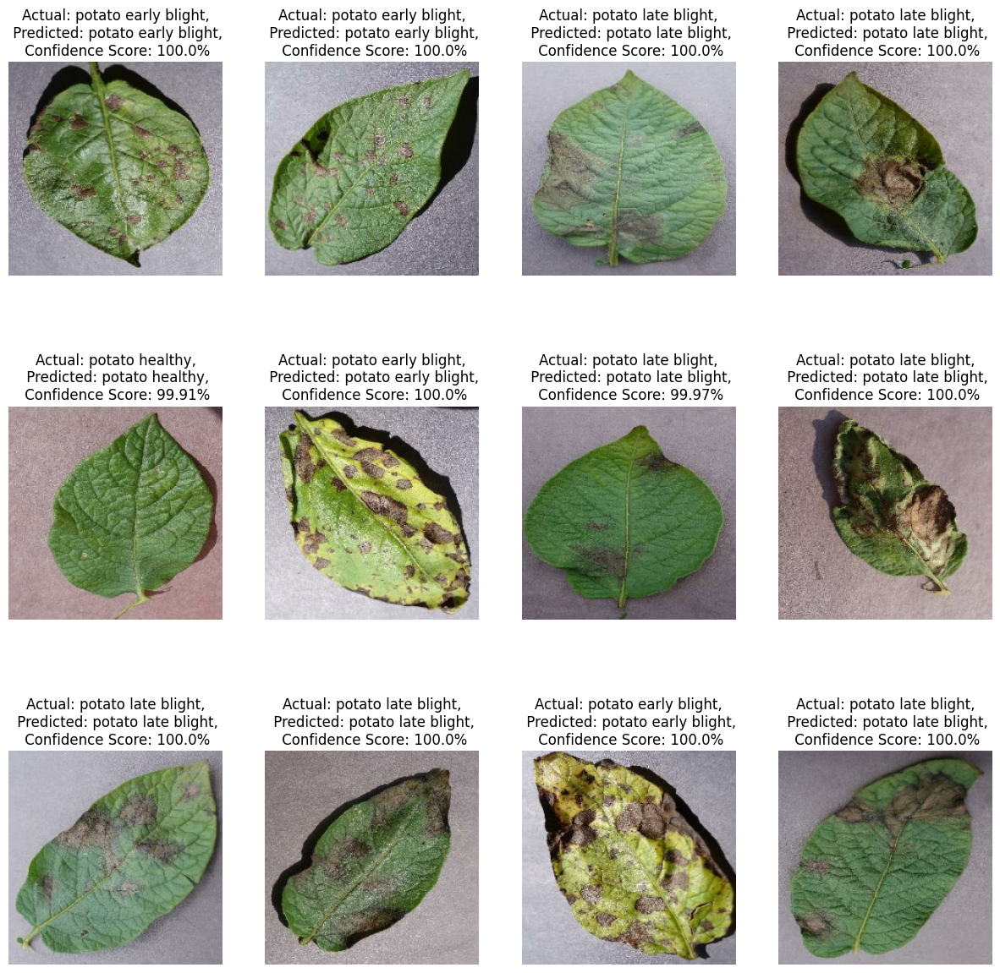

In [49]:
plt.figure(figsize=(15,15))
for images,labels in test_ds.take(1):
    for i in range(12):
        ax = plt.subplot(3,4,i+1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class , confidence = predict(Model1_DenseNet,images[i].numpy())
        actual_class = classes[labels[i]]
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class},\n Confidence Score: {confidence}%")
        plt.axis("off")

In [50]:
pred_class = []
act_class = []
for images,labels in test_ds:
    for i in range(len(test_ds)):
        #ax = plt.subplot(3,4,i+1)
        #plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class , confidence = predict(Model1_DenseNet,images[i].numpy())
        actual_class = classes[labels[i]]

        pred_class.append(predicted_class)
        act_class.append(actual_class)

1/1 [==============================] - 0s 32ms/step


In [51]:
act_class

['potato healthy',
 'potato healthy',
 'potato late blight',
 'potato late blight',
 'potato early blight',
 'potato early blight',
 'potato early blight',
 'potato early blight',
 'potato late blight',
 'potato late blight',
 'potato late blight',
 'potato late blight',
 'potato late blight',
 'potato late blight',
 'potato late blight',
 'potato late blight']

In [52]:
cm = confusion_matrix(act_class, pred_class, labels=classes)

In [53]:
def plot_confusion_matrix(cm, classes):
    plt.figure(figsize=(16,5))
    ax = sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')
    ax.set_title('Confusion Matrix with labels\n');
    ax.set_xlabel('\nPredicted Values')
    ax.set_ylabel('Actual Values ');

    ax.xaxis.set_ticklabels(classes, rotation=45)
    ax.yaxis.set_ticklabels(classes, rotation=45)

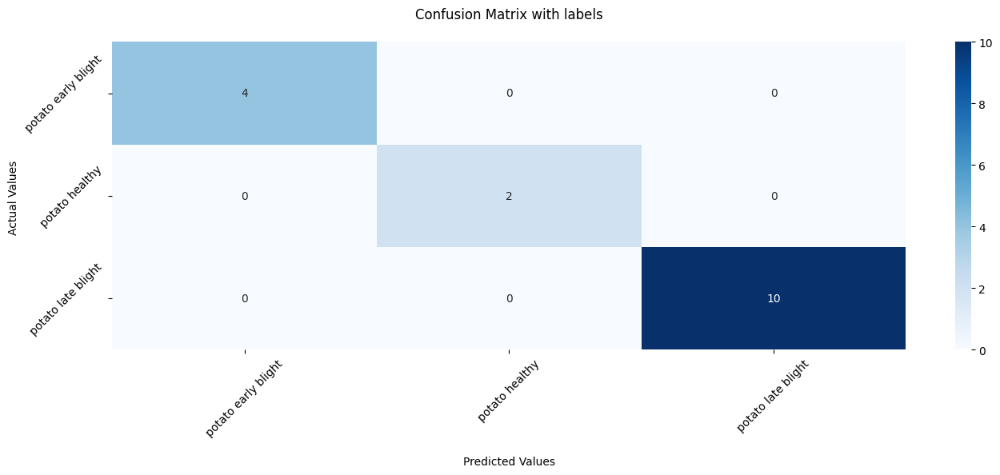

In [54]:
plot_confusion_matrix(cm = cm, classes = classes)

### Model 2: Inception121

In [57]:
model_path = '/content/drive/MyDrive/FINAL_PROJECT/POTATO/Inception/Inceptionv3Model_Potato_v1 (1).h5'
Model2_Inception = tf.keras.models.load_model(model_path)
Model2_Inception.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 111, 111, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                             

In [58]:
score_train = Model2_Inception.evaluate(train_ds)
score_valid = Model2_Inception.evaluate(val_ds)
score_test = Model2_Inception.evaluate(test_ds)

4/4 [==============================] - 1s 68ms/step - loss: 0.0146 - accuracy: 1.0000


first image to predict
actual label: potato early blight
1/1 [==============================] - 1s 1s/step
predicted label: potato early blight


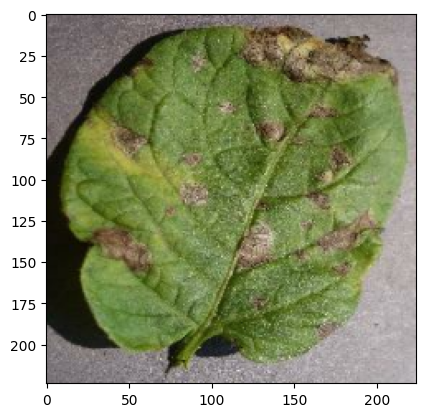

In [59]:
import numpy as np
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()
    
    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",classes[first_label])
    
    batch_prediction = Model2_Inception.predict(images_batch)
    print("predicted label:",classes[np.argmax(batch_prediction[0])])

In [60]:
def predict(model,img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0) # Create a batch
    predictions = model.predict (img_array)
    predicted_class = classes[np.argmax(predictions[0])]
#     confidence = round(np.max(predictions[0]),2)
    confidence = round(100*(np.max(predictions[0])),2)

    return predicted_class, confidence

1/1 [==============================] - 0s 32ms/step


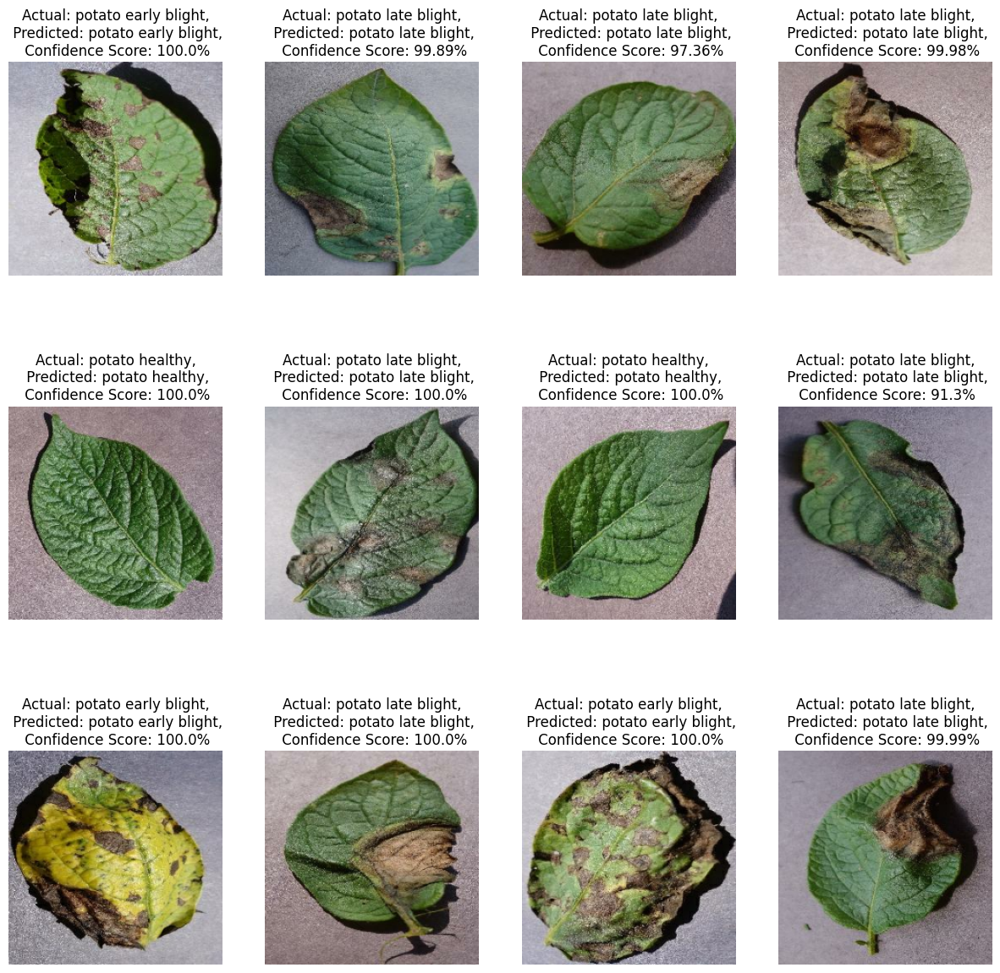

In [61]:
plt.figure(figsize=(15,15))
for images,labels in test_ds.take(1):
    for i in range(12):
        ax = plt.subplot(3,4,i+1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class , confidence = predict(Model2_Inception,images[i].numpy())
        actual_class = classes[labels[i]]
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class},\n Confidence Score: {confidence}%")
        plt.axis("off")

In [62]:
pred_class = []
act_class = []
for images,labels in test_ds:
    for i in range(len(test_ds)):
        #ax = plt.subplot(3,4,i+1)
        #plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class , confidence = predict(Model2_Inception,images[i].numpy())
        actual_class = classes[labels[i]]

        pred_class.append(predicted_class)
        act_class.append(actual_class)

1/1 [==============================] - 0s 27ms/step


In [63]:
act_class

['potato late blight',
 'potato late blight',
 'potato healthy',
 'potato late blight',
 'potato early blight',
 'potato healthy',
 'potato early blight',
 'potato late blight',
 'potato late blight',
 'potato late blight',
 'potato late blight',
 'potato early blight',
 'potato early blight',
 'potato late blight',
 'potato early blight',
 'potato late blight']

In [64]:
cm = confusion_matrix(act_class, pred_class, labels=classes)

In [65]:
def plot_confusion_matrix(cm, classes):
    plt.figure(figsize=(16,5))
    ax = sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')
    ax.set_title('Confusion Matrix with labels\n');
    ax.set_xlabel('\nPredicted Values')
    ax.set_ylabel('Actual Values ');

    ax.xaxis.set_ticklabels(classes, rotation=45)
    ax.yaxis.set_ticklabels(classes, rotation=45)

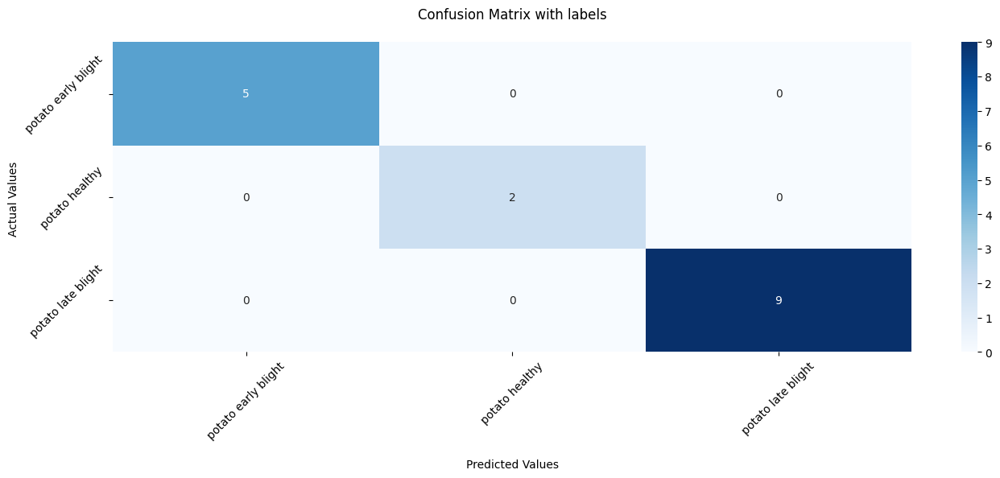

In [66]:
plot_confusion_matrix(cm = cm, classes = classes)

### Model 3: resnet50

In [68]:
model_path = '/content/drive/MyDrive/FINAL_PROJECT/POTATO/RESNET/Resnet50Model_Potato_v1.h5'
model3_resnet = tf.keras.models.load_model(model_path)
model3_resnet.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 tf.__operators__.getitem (S  (None, 224, 224, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 224, 224, 3)      0         
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 flatten (Flatten)           (None, 2048)              0     

In [69]:
score_train = model3_resnet.evaluate(train_ds)
score_valid = model3_resnet.evaluate(val_ds)
score_test = model3_resnet.evaluate(test_ds)

4/4 [==============================] - 1s 95ms/step - loss: 0.0019 - accuracy: 1.0000


first image to predict
actual label: potato early blight
1/1 [==============================] - 1s 891ms/step
predicted label: potato early blight


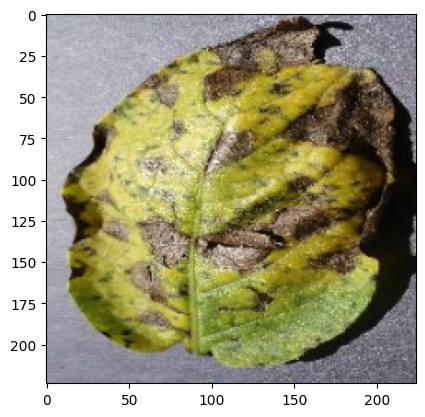

In [71]:
import numpy as np
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()
    
    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",classes[first_label])
    
    batch_prediction = model3_resnet.predict(images_batch)
    print("predicted label:",classes[np.argmax(batch_prediction[0])])

In [72]:
def predict(model,img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0) # Create a batch
    predictions = model.predict (img_array)
    predicted_class = classes[np.argmax(predictions[0])]
#     confidence = round(np.max(predictions[0]),2)
    confidence = round(100*(np.max(predictions[0])),2)

    return predicted_class, confidence

1/1 [==============================] - 0s 23ms/step


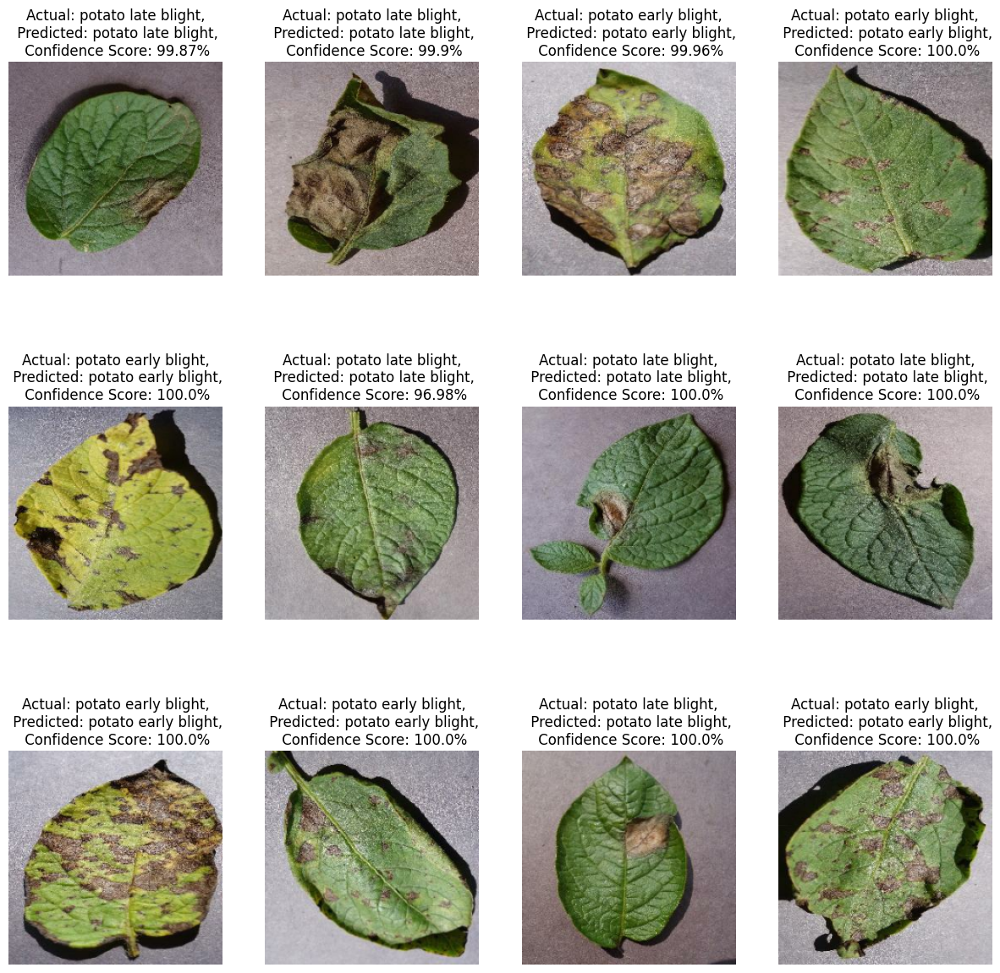

In [74]:
plt.figure(figsize=(15,15))
for images,labels in test_ds.take(1):
    for i in range(12):
        ax = plt.subplot(3,4,i+1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class , confidence = predict(model3_resnet,images[i].numpy())
        actual_class = classes[labels[i]]
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class},\n Confidence Score: {confidence}%")
        plt.axis("off")

In [75]:
pred_class = []
act_class = []
for images,labels in test_ds:
    for i in range(len(test_ds)):
        #ax = plt.subplot(3,4,i+1)
        #plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class , confidence = predict(model3_resnet,images[i].numpy())
        actual_class = classes[labels[i]]

        pred_class.append(predicted_class)
        act_class.append(actual_class)

1/1 [==============================] - 0s 23ms/step


In [76]:
act_class

['potato late blight',
 'potato late blight',
 'potato healthy',
 'potato healthy',
 'potato healthy',
 'potato late blight',
 'potato late blight',
 'potato late blight',
 'potato early blight',
 'potato late blight',
 'potato early blight',
 'potato early blight',
 'potato early blight',
 'potato late blight',
 'potato early blight',
 'potato early blight']

In [77]:
cm = confusion_matrix(act_class, pred_class, labels=classes)

In [78]:
def plot_confusion_matrix(cm, classes):
    plt.figure(figsize=(16,5))
    ax = sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')
    ax.set_title('Confusion Matrix with labels\n');
    ax.set_xlabel('\nPredicted Values')
    ax.set_ylabel('Actual Values ');

    ax.xaxis.set_ticklabels(classes, rotation=45)
    ax.yaxis.set_ticklabels(classes, rotation=45)

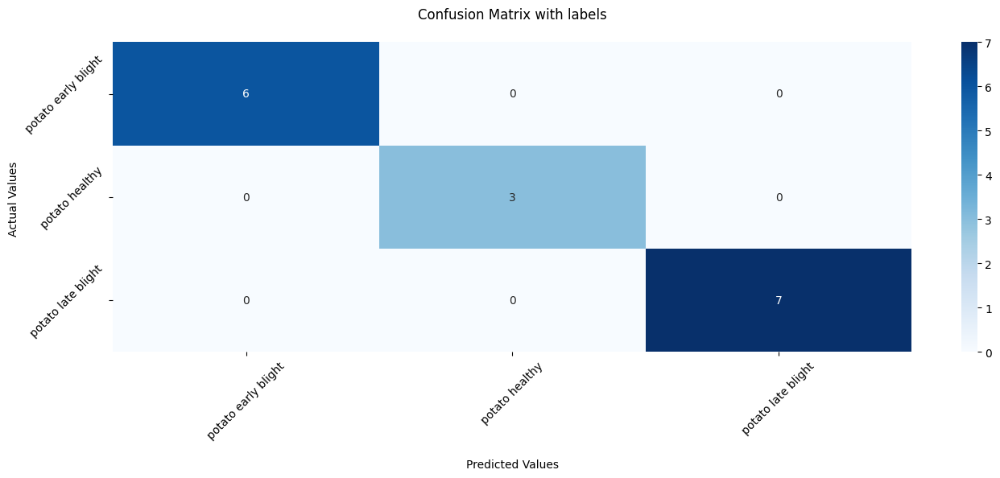

In [79]:
plot_confusion_matrix(cm = cm, classes = classes)

### Model 4: MobileNET

In [81]:
model_path = '/content/drive/MyDrive/FINAL_PROJECT/POTATO/MobileNet/MBNetv2Model_Potato_v1.h5'
model4_mobilenet = tf.keras.models.load_model(model_path)
model4_mobilenet.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                             

In [83]:
score_train = model4_mobilenet.evaluate(train_ds)
score_valid = model4_mobilenet.evaluate(val_ds)
score_test = model4_mobilenet.evaluate(test_ds)

4/4 [==============================] - 1s 40ms/step - loss: 0.0041 - accuracy: 1.0000


first image to predict
actual label: potato healthy
1/1 [==============================] - 1s 738ms/step
predicted label: potato healthy


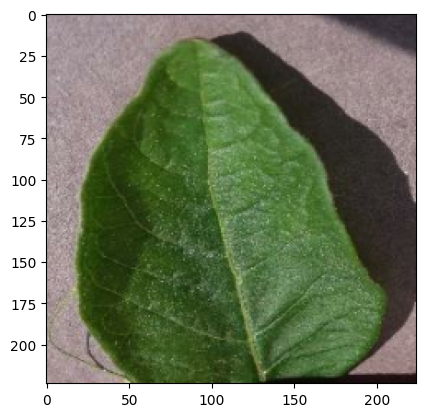

In [84]:
import numpy as np
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()
    
    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",classes[first_label])
    
    batch_prediction = model4_mobilenet.predict(images_batch)
    print("predicted label:",classes[np.argmax(batch_prediction[0])])

In [85]:
def predict(model,img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0) # Create a batch
    predictions = model.predict (img_array)
    predicted_class = classes[np.argmax(predictions[0])]
#     confidence = round(np.max(predictions[0]),2)
    confidence = round(100*(np.max(predictions[0])),2)

    return predicted_class, confidence

1/1 [==============================] - 0s 25ms/step


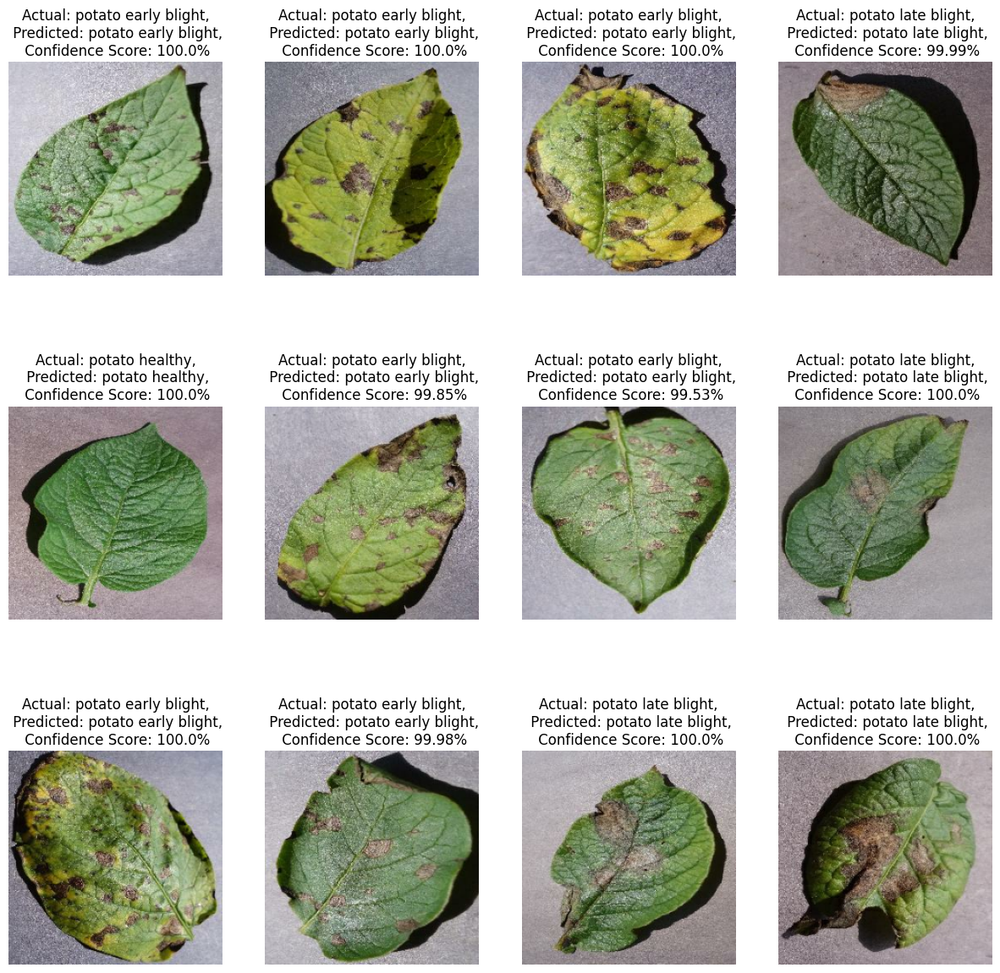

In [87]:
plt.figure(figsize=(15,15))
for images,labels in test_ds.take(1):
    for i in range(12):
        ax = plt.subplot(3,4,i+1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class , confidence = predict(model4_mobilenet,images[i].numpy())
        actual_class = classes[labels[i]]
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class},\n Confidence Score: {confidence}%")
        plt.axis("off")

In [89]:
pred_class = []
act_class = []
for images,labels in test_ds:
    for i in range(len(test_ds)):
        #ax = plt.subplot(3,4,i+1)
        #plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class , confidence = predict(model4_mobilenet,images[i].numpy())
        actual_class = classes[labels[i]]

        pred_class.append(predicted_class)
        act_class.append(actual_class)

1/1 [==============================] - 0s 23ms/step


In [90]:
act_class

['potato early blight',
 'potato late blight',
 'potato late blight',
 'potato early blight',
 'potato healthy',
 'potato early blight',
 'potato late blight',
 'potato healthy',
 'potato late blight',
 'potato early blight',
 'potato late blight',
 'potato early blight',
 'potato healthy',
 'potato late blight',
 'potato early blight',
 'potato early blight']

In [91]:
cm = confusion_matrix(act_class, pred_class, labels=classes)

In [92]:
def plot_confusion_matrix(cm, classes):
    plt.figure(figsize=(16,5))
    ax = sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')
    ax.set_title('Confusion Matrix with labels\n');
    ax.set_xlabel('\nPredicted Values')
    ax.set_ylabel('Actual Values ');

    ax.xaxis.set_ticklabels(classes, rotation=45)
    ax.yaxis.set_ticklabels(classes, rotation=45)

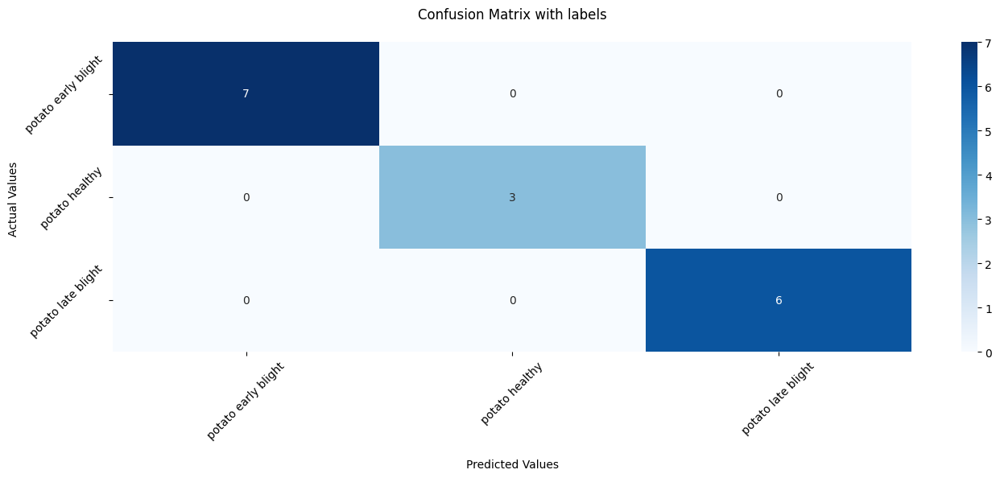

In [93]:
plot_confusion_matrix(cm = cm, classes = classes)

### Compiled Comparison

In [98]:
list_modelnames = ["DennseNet_Potato", "Inception_potato", "mobilenet_Potato", "ResNet152V2_POTATO"]
dict_histories = {}
saved_model_his = "/content/drive/MyDrive/FINAL_PROJECT/POTATO/save_model_history/"

# load model into new variable
for modelname in list_modelnames:
  with open(os.path.join(saved_model_his, modelname), 'rb') as file_pi:
    dict_histories[modelname] = pickle.load(file_pi)

dict_histories.keys()

dict_keys(['DennseNet_Potato', 'Inception_potato', 'mobilenet_Potato', 'ResNet152V2_POTATO'])

In [101]:
dict_acc = {}
dict_val_acc = {}
dict_loss = {}
dict_val_loss = {}

for modelname in list_modelnames:
  dict_acc[modelname] = dict_histories[modelname]['accuracy']
  dict_val_acc[modelname] = dict_histories[modelname]['val_accuracy']
  dict_loss[modelname] = dict_histories[modelname]['loss']
  dict_val_loss[modelname] = dict_histories[modelname]['val_loss']

label_plot = ['DennseNet_Potato', 'Inception_Potato', 'mobilenet_Potato', 'ResNet152V2_Potato']
marker_plot = ['o','x','v','^']

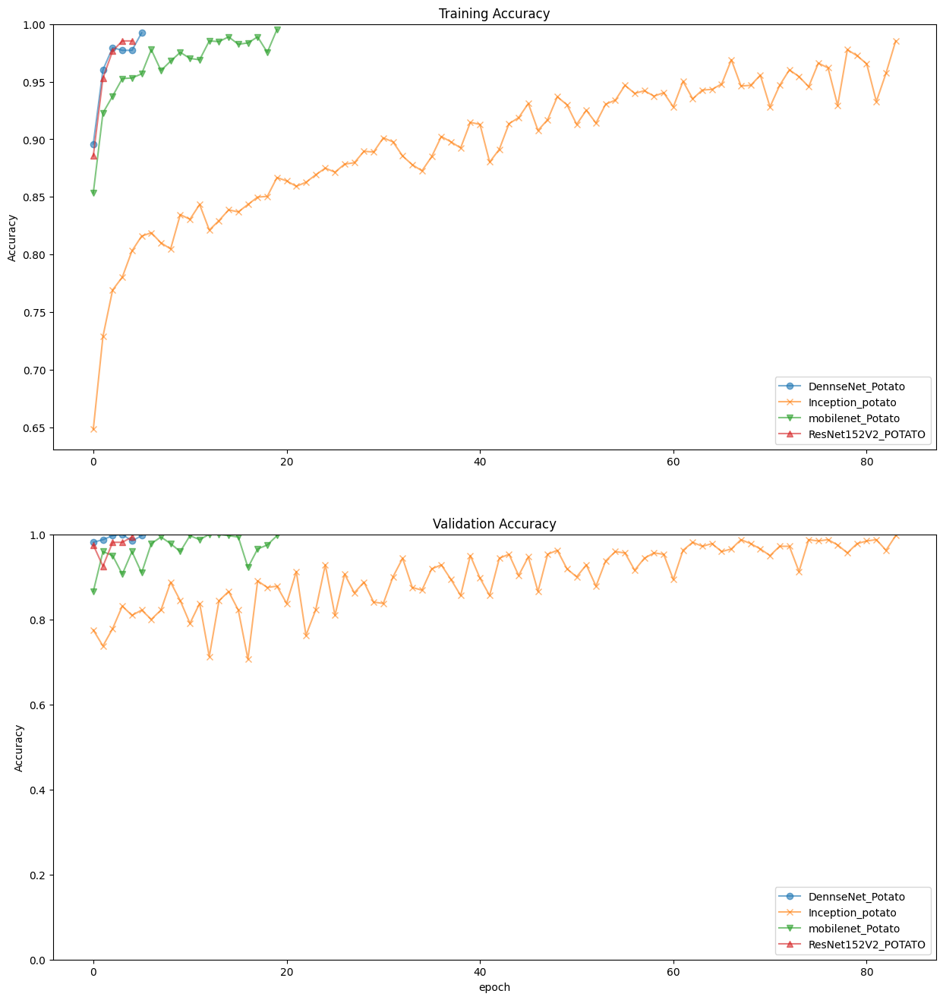

In [102]:
plt.figure(figsize=(15, 16))
plt.subplot(2, 1, 1)
for i in range(len(list_modelnames)):
  plt.plot(dict_acc[list_modelnames[i]], label=label_plot[i], marker=marker_plot[i], markersize=6, alpha=0.6)

plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training Accuracy')

plt.subplot(2, 1, 2)
for i in range(len(list_modelnames)):
  plt.plot(dict_val_acc[list_modelnames[i]], label=label_plot[i], marker=marker_plot[i], markersize=6, alpha=0.6)

plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([0,1.0])
plt.title('Validation Accuracy')
plt.xlabel('epoch')
plt.savefig('acc_all_model.png')

plt.show()

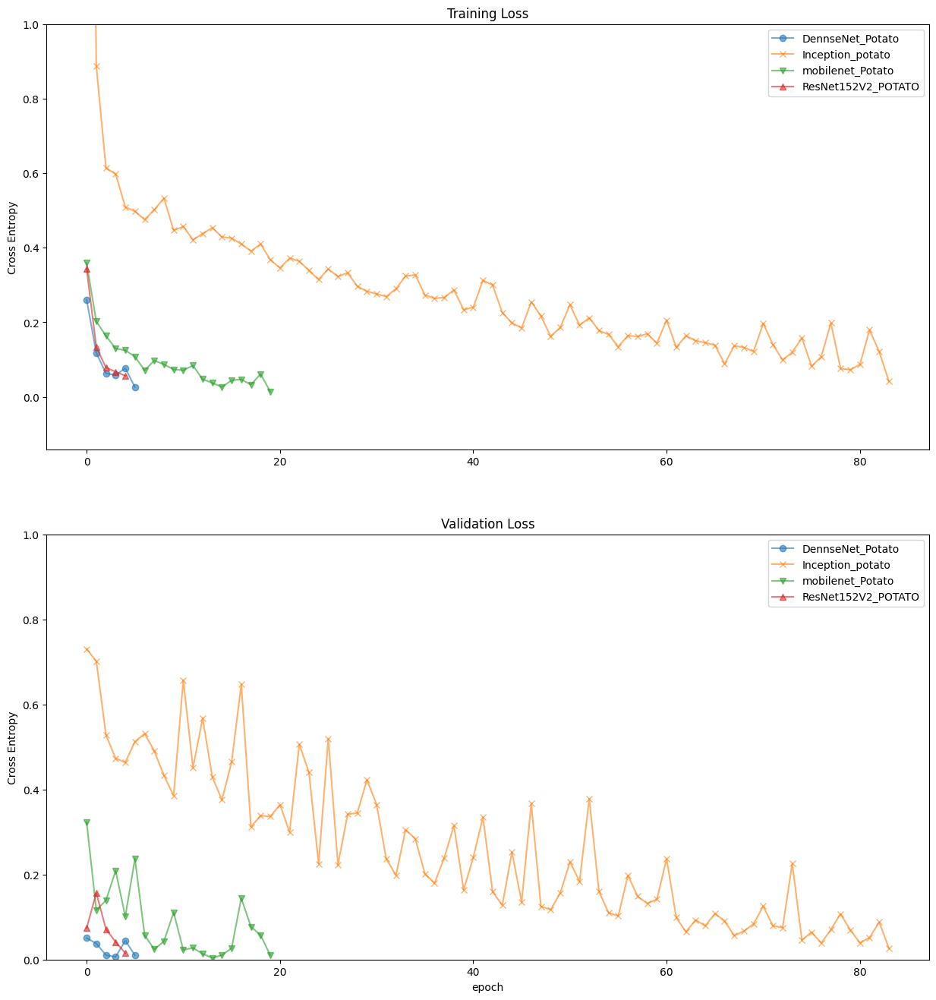

In [103]:
plt.figure(figsize=(15, 16))
plt.subplot(2, 1, 1)

for i in range(len(list_modelnames)):
  plt.plot(dict_loss[list_modelnames[i]], label=label_plot[i], marker=marker_plot[i], markersize=6, alpha=0.6)

plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training Loss')

plt.subplot(2, 1, 2)

for i in range(len(list_modelnames)):
  plt.plot(dict_val_loss[list_modelnames[i]], label=label_plot[i], marker=marker_plot[i], markersize=6, alpha=0.6)
  
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Validation Loss')
plt.xlabel('epoch')

plt.savefig('loss_all_model.png')

plt.show()

In [105]:
model_h5_names = ['/content/drive/MyDrive/FINAL_PROJECT/POTATO/DenseNet/DenseNet121Model_Potato2.h5', '/content/drive/MyDrive/FINAL_PROJECT/POTATO/Inception/Inceptionv3Model_Potato_v1 (1).h5', 
                  '/content/drive/MyDrive/FINAL_PROJECT/POTATO/RESNET/Resnet50Model_Potato_v1.h5', '/content/drive/MyDrive/FINAL_PROJECT/POTATO/MobileNet/MBNetv2Model_Potato_v1.h5']
dict_models = {}

for modelname in model_h5_names:
    #dict_models[modelname] = tf.keras.models.load_model('{}.h5'.format(modelname))
    dict_models[modelname] = tf.keras.models.load_model(modelname)

In [106]:
dict_score_train = {}
dict_score_valid = {}
dict_score_test = {}

for modelname in model_h5_names:
  dict_score_train[modelname] = dict_models[modelname].evaluate(train_ds)
  dict_score_valid[modelname] = dict_models[modelname].evaluate(val_ds)
  dict_score_test[modelname] = dict_models[modelname].evaluate(test_ds)


4/4 [==============================] - 1s 40ms/step - loss: 0.0407 - accuracy: 0.9844


In [107]:
df1 = pd.DataFrame({
    'Model': list_modelnames,
    'Train': [eval[1] for eval in dict_score_train.values()],
    'Valid': [eval[1] for eval in dict_score_valid.values()],
    'Test': [eval[1] for eval in dict_score_test.values()],
})

df2 = pd.DataFrame({
    'Model': list_modelnames,
    'Train': [eval[0] for eval in dict_score_train.values()],
    'Valid': [eval[0] for eval in dict_score_valid.values()],
    'Test': [eval[0] for eval in dict_score_test.values()],
})

tidy1 = df1.melt(id_vars='Model').rename(columns=str.title)

tidy2 = df2.melt(id_vars='Model').rename(columns=str.title)

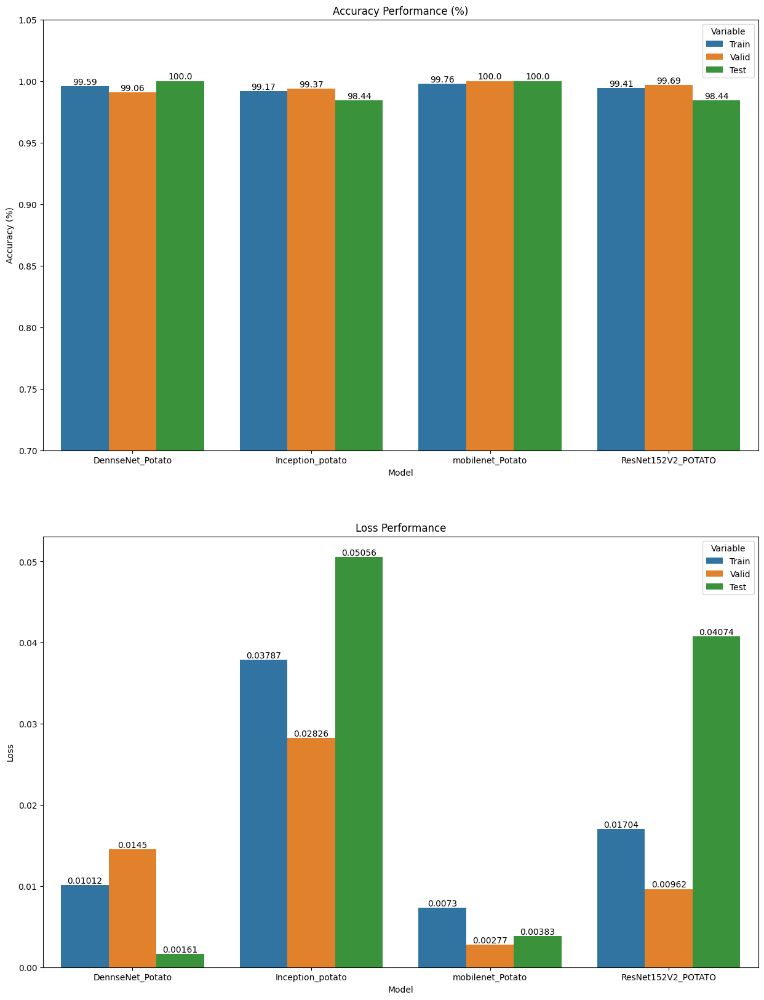

In [108]:

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 20))

sns.barplot(x='Model', y='Value', hue='Variable', data=tidy1, ax=ax1)
ax1.set_ylabel('Accuracy (%)')
ax1.set_ylim([0.7 ,1.05])
ax1.set_title('Accuracy Performance (%)')

for p, data in zip(ax1.patches, tidy1['Value']):
    ax1.annotate(round(data*100, 2), xy=(p.get_x()+p.get_width()/2, p.get_height()),
                ha='center', va='bottom')

sns.barplot(x='Model', y='Value', hue='Variable', data=tidy2, ax=ax2)
ax2.set_ylabel('Loss')
ax2.set_title('Loss Performance')

for p, data in zip(ax2.patches, tidy2['Value']):
    ax2.annotate(round(data, 5), xy=(p.get_x()+p.get_width()/2, p.get_height()),
                ha='center', va='bottom')

plt.savefig('corn_all_model_comparisons.png')
plt.show()

## Best Model Conversion

In [109]:
tflite_converter = tf.lite.TFLiteConverter.from_keras_model(model4_mobilenet)
tflite_model = tflite_converter.convert()
open("tf_lite_model_corn.tflite", "wb").write(tflite_model)

12140812